DCGAN MARIN HULL GENERATOR
==============

**Author**: Kirsten Odendaal


In [1]:
#%matplotlib inline
import argparse
import os
import io
import time
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.lines import Line2D
from IPython.display import HTML
import tensorboard
from torch.utils.tensorboard import SummaryWriter


from utils_data import load_geometries_from_folder  
import utils_plot as uplot

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

c:\Users\kodendaal\AppData\Local\anaconda3\envs\Privi_311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Random Seed:  999


Inputs
======

-   `dataroot` - the path to the root of the dataset folder. We will
    talk more about the dataset in the next section.
-   `workers` - the number of worker threads for loading the data with
    the `DataLoader`.
-   `batch_size` - the batch size used in training. The DCGAN paper uses
    a batch size of 128.
-   `image_size` - the spatial size of the images used for training.
    This implementation defaults to 64x64. If another size is desired,
    the structures of D and G must be changed. See
    [here](https://github.com/pytorch/examples/issues/70) for more
    details.
-   `nc` - number of color channels in the input images. For color
    images this is 3.
-   `nz` - length of latent vector.
-   `ngf` - relates to the depth of feature maps carried through the
    generator.
-   `ndf` - sets the depth of feature maps propagated through the
    discriminator.
-   `num_epochs` - number of training epochs to run. Training for longer
    will probably lead to better results but will also take much longer.
-   `lr` - learning rate for training. As described in the DCGAN paper,
    this number should be 0.0002.
-   `beta1` - beta1 hyperparameter for Adam optimizers. As described in
    paper, this number should be 0.5.
-   `ngpu` - number of GPUs available. If this is 0, code will run in
    CPU mode. If this number is greater than 0 it will run on that
    number of GPUs.


In [2]:
# Root directory for dataset
data_root = r'P:\70xxx\701xx\7018x\70180\RD\301 - HullGAN\Encode'

# Number of workers for dataloader
workers = 1

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = (40, 20)

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 500

# Learning rate for optimizers
lr = 0.0001 # 0.0002 original

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 0

Data
====

Create a custom dataset class to load the geometries from the folder.


In [3]:
# Dataset class
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data, transform=None):
        self.data = data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        sample = self.data[idx]
        if self.transform:
            sample = self.transform(sample)
        return sample

# Load the geometries
def load_data(folder_path):
    all_geoms = []
    all_labels = []
    
    for fi in os.listdir(folder_path):
        if not fi.endswith('.gh'):
            encode_path = os.path.join(folder_path, fi)
            geometries, labels = load_geometries_from_folder(encode_path)
            all_geoms.extend(geometries)
            all_labels.extend(labels)
    geos = np.transpose(all_geoms, (0, 2, 1)).reshape(len(all_geoms), 3, 40, -1)
    
    # Calculate max and min for each channel (axis=0 for batch size)
    x_max, x_min = np.max(geos[:, 0, :, :]), np.min(geos[:, 0, :, :])
    y_max, y_min = np.max(geos[:, 1, :, :]), np.min(geos[:, 1, :, :])
    z_max, z_min = np.max(geos[:, 2, :, :]), np.min(geos[:, 2, :, :])

    # Display results
    print("Max and Min values per channel:")
    print(f"X Channel - Max: {x_max}, Min: {x_min}")
    print(f"Y Channel - Max: {y_max}, Min: {y_min}")
    print(f"Z Channel - Max: {z_max}, Min: {z_min}")
        
    return torch.tensor(geos, dtype=torch.float32)

def get_stats(dataloader):
    tot_pixels = 0
    num_samples = 0
    mean = torch.zeros(3)
    stdev = torch.zeros(3)

    for data in dataloader:
        b, c, h, w = data.shape
        num_pixels = b * h * w
        sum_ = torch.sum(data, dim=[0, 2, 3])
        sum_of_square = torch.sum(data ** 2, dim=[0, 2, 3])
        mean = (tot_pixels * mean + sum_) / (tot_pixels + num_pixels)
        stdev = (tot_pixels * stdev + sum_of_square) / (tot_pixels + num_pixels)
        
        num_samples += 1
        tot_pixels += num_pixels
        print('\r'+f'{(num_samples / len(dataloader)*100):.3f}% processed',end='')

    return mean, torch.sqrt(stdev - mean ** 2)

def mpl_to_tensor(fig):
    """
    Convert a Matplotlib figure to a PyTorch tensor for TensorBoard logging.
    
    Args:
        fig (matplotlib.figure.Figure): Matplotlib figure to convert
    
    Returns:
        torch.Tensor: Image tensor ready for TensorBoard logging
    """
    # Save figure to a buffer
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight', dpi=300)
    buf.seek(0)
    
    # Read the buffer into a numpy array
    img_arr = plt.imread(buf, format='png')
    
    # Transpose to match TensorBoard's expected format (H, W, C) -> (C, H, W)
    img_tensor = torch.from_numpy(img_arr).permute(2, 0, 1)
    
    # Close the buffer
    buf.close()
    plt.close(fig)  # Close the figure to free memory
    
    return img_tensor


Data Inspection
====

Load data from root folder and inspect data statistics as well as plotting of the the real data batches

# To Do:

1. Apply data transformations - check scaling of input data. Currently only x goes from [-1,1]. However, it might be also be neccessary to scale the other dimensions accordingly. 

Max and Min values per channel:
X Channel - Max: 1.0, Min: -1.0
Y Channel - Max: 0.3394529162961484, Min: 0.0
Z Channel - Max: 0.5432778542856396, Min: 0.0
100.000% processed
Pixel Mean: tensor([0.1161, 0.0818, 0.1014]), Pixel Stdev: tensor([0.6733, 0.0613, 0.0718])
torch.Size([128, 3, 40, 20])


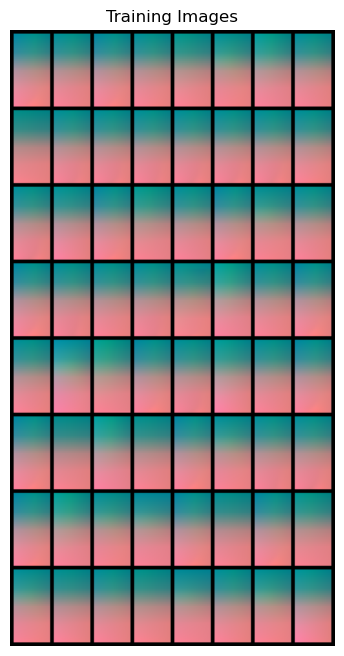

In [4]:
# Load data
tensor_data = load_data(data_root)

# Create a simple DataLoader to calculate stats
dataloader = torch.utils.data.DataLoader(CustomDataset(tensor_data), batch_size=batch_size, shuffle=True, drop_last=True)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

mean, stdev = get_stats(dataloader)
print(f'\nPixel Mean: {mean}, Pixel Stdev: {stdev}')

# Plot some training images
real_batch = next(iter(dataloader))
print(real_batch.shape)

plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()


(16, 3, 40, 20)


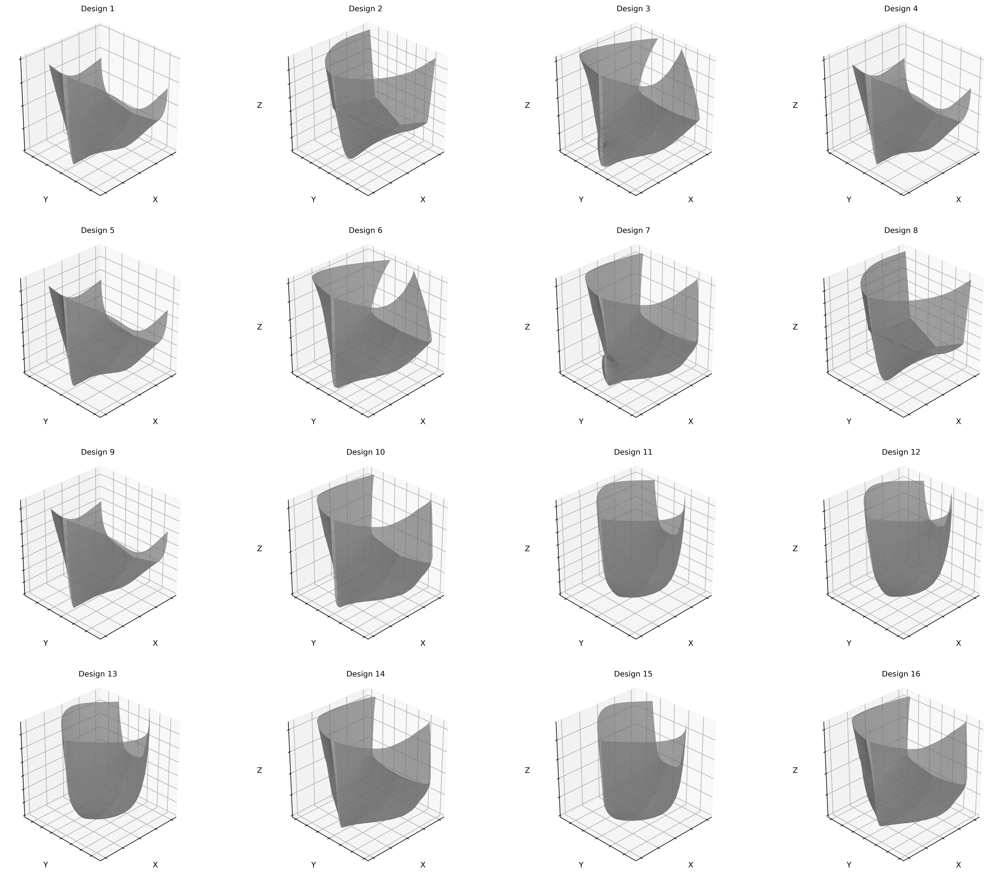

In [5]:
# Get a batch of designs
real_batch = next(iter(dataloader))

# Convert to numpy and plot first 4 designs
designs = real_batch[:16].cpu().numpy()
print(designs.shape)
fig = uplot.plot_design_grid_mpl(designs, rows=4, cols=4)
plt.show()


Implementation
==============

With our input parameters set and the dataset prepared, we can now get
into the implementation. We will start with generator, discriminator, weight initialization, loss functions,
and training loop.


Generator
=========

The generator, $G$, is designed to map the latent space vector ($z$) to
data-space. Since our data are images, converting $z$ to data-space
means ultimately creating a RGB image with the same size as the training
images (i.e. 3x64x64). In practice, this is accomplished through a
series of strided two dimensional convolutional transpose layers, each
paired with a 2d batch norm layer and a relu activation. The output of
the generator is fed through a tanh function to return it to the input
data range of $[-1,1]$. It is worth noting the existence of the batch
norm functions after the conv-transpose layers, as this is a critical
contribution of the DCGAN paper. These layers help with the flow of
gradients during training. An image of the generator from the DCGAN
paper is shown below.

![](https://pytorch.org/tutorials/_static/img/dcgan_generator.png)

Notice, how the inputs we set in the input section (`nz`, `ngf`, and
`nc`) influence the generator architecture in code. `nz` is the length
of the z input vector, `ngf` relates to the size of the feature maps
that are propagated through the generator, and `nc` is the number of
channels in the output image (set to 3 for x, y, z geometries). Below is the
code for the generator.


## To Do
1. Add spectral norm to the generator (every conv2d_transpose_block)
2. check bias in functions


In [6]:
class Generator(nn.Module):
    def __init__(self, ngpu, nz, ngf, nc):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # Input: Z latent vector (nz) x 1 x 1
            nn.ConvTranspose2d(nz, ngf * 8, kernel_size=3, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # Shape: (ngf*8) x 3 x 3
            
            nn.ConvTranspose2d(ngf * 8, ngf * 4, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # Shape: (ngf*4) x 5 x 5
            
            nn.ConvTranspose2d(ngf * 4, ngf * 2, kernel_size=(4, 3), stride=(2, 1), padding=(1, 1), bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # Shape: (ngf*2) x 10 x 5
            
            nn.ConvTranspose2d(ngf * 2, ngf, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # Shape: (ngf) x 20 x 10
            
            nn.ConvTranspose2d(ngf, nc, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
            # Final output shape: (nc) x 40 x 20
        )

    def forward(self, input):
        return self.main(input)



Discriminator
=============

As mentioned, the discriminator, $D$, is a binary classification network
that takes an image as input and outputs a scalar probability that the
input image is real (as opposed to fake). Here, $D$ takes a 3x64x64
input image, processes it through a series of Conv2d, BatchNorm2d, and
LeakyReLU layers, and outputs the final probability through a Sigmoid
activation function. This architecture can be extended with more layers
if necessary for the problem, but there is significance to the use of
the strided convolution, BatchNorm, and LeakyReLUs. The DCGAN paper
mentions it is a good practice to use strided convolution rather than
pooling to downsample because it lets the network learn its own pooling
function. Also batch norm and leaky relu functions promote healthy
gradient flow which is critical for the learning process of both $G$ and
$D$.

## To Do
1. Add spectral norm to the generator (every conv2d_transpose_block)
2. Add drop out every layer


In [7]:
class Discriminator(nn.Module):
    def __init__(self, ngpu, nc, ndf):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is `(nc) x 40 x 20
            nn.Dropout(0.5),
            nn.Conv2d(nc, ndf, (4,4), (2,2), (1,1), bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. `(ndf) x 20 x 10
            
            nn.Conv2d(ndf, ndf * 2, (4,4), (2,2), (1,1), bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. `(ndf*2) x 10 x 5
            
            nn.Conv2d(ndf * 2, ndf * 4, (4,3), (2,1), (1,1), bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. `(ndf*4) x 5 x 5
            
            nn.Conv2d(ndf * 4, ndf * 8, (3,3), (2,2), (1,1), bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. `(ndf*8) x 3 x 3
            
            nn.Conv2d(ndf * 8, 1, (3,3), (1,1), (0,0), bias=False),
            nn.Sigmoid()
            # state size. 1 x 1 x 1
        )

    def forward(self, input):
        return self.main(input).view(-1, 1).squeeze(1)



Weight Initialization
---------------------

From the DCGAN paper, the authors specify that all model weights shall
be randomly initialized from a Normal distribution with `mean=0`,
`stdev=0.02`. The `weights_init` function takes an initialized model as
input and reinitializes all convolutional, convolutional-transpose, and
batch normalization layers to meet this criteria. This function is
applied to the models immediately after initialization.


In [8]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# ^^^ this is a repeat of the below block vvv
# # this explicit weight init from standard normal distribution didn't improve performance 
# # possibly because batchnorm is enough to mitigate the impact of poorly initialized weights
# def weights_init(model):
#     classname = model.__class__.__name__
#     if classname.find("Conv2d") != -1:
#         torch.nn.init.normal_(model.weight.data, 0.0, 0.02)
#     elif classname.find("BatchNorm2d") != -1:
#         # 1-centered normal distribution, stdev==0.02 as specified in Radford et al, 2015
#         torch.nn.init.normal_(model.weight.data, 1.0, 0.02)
#         torch.nn.init.constant_(model.bias.data, 0.0)
#     # print(f'Weights initialized for {model.__class__.__name__}')


# # generates a latent vector (z) sampled from a standard normal (Gaussian) distribution
# # adapted from https://discuss.pytorch.org/t/check-gradient-flow-in-network/15063/10
# def get_gaussian_latent_vectors(batch_size, device):
#     return torch.randn((batch_size, latent_vector_dim), device=device)


# function to plot gradients after training loop is over 
# will make it obvious if any gradients are exploding/vanishing
# goes into training loop after loss.backwards()
# def plot_grad_flow(named_parameters):
#     ave_grads = []
#     max_grads= []
#     layers = []
#     for n, p in named_parameters:
#         if(p.requires_grad) and ("bias" not in n):
#             layers.append(n)
#             ave_grads.append(p.grad.abs().mean())
#             max_grads.append(p.grad.abs().max())
#     plt.bar(np.arange(len(max_grads)), max_grads, alpha=0.1, lw=1, color="c")
#     plt.bar(np.arange(len(max_grads)), ave_grads, alpha=0.1, lw=1, color="b")
#     plt.hlines(0, 0, len(ave_grads)+1, lw=2, color="k" )
#     plt.xticks(range(0,len(ave_grads), 1), layers, rotation="vertical")
#     plt.xlim(left=0, right=len(ave_grads))
#     plt.ylim(bottom = -0.001, top=0.02) # zoom in on the lower gradient regions
#     plt.xlabel("Layers")
#     plt.ylabel("average gradient")
#     plt.title("Gradient flow")
#     plt.grid(True)
#     plt.legend([Line2D([0], [0], color="c", lw=4),
#                 Line2D([0], [0], color="b", lw=4),
#                 Line2D([0], [0], color="k", lw=4)], ['max-gradient', 'mean-gradient', 'zero-gradient'])

Advanced Methods
================

1. Not applied yet. Comes from GANHacks 
2. Add squeeze and excitation block

In [9]:
# # simple addition layer of gaussian instance noise 
# # suggested in https://arxiv.org/abs/1906.04612
# class GaussianNoise(nn.Module):
#     # sigma: sigma*pixel value = stdev of added noise from normal distribution 
#     def __init__(self, sigma=0.1):
#         super().__init__()
#         self.sigma = sigma
#         self.register_buffer('noise', torch.tensor(0))

#     def forward(self, x):
#         if self.training and self.sigma != 0:
#             # scale of noise = stdev of gaussian noise = sigma * pixel value 
#             scale = self.sigma * x.detach()
#             sampled_noise = self.noise.expand(*x.size()).float().normal_() * scale
#             x = x + sampled_noise
#         return x 

# # spectralnorm constrains the Lipschitz constant (strong form of uniform continuity) of the convolutional filters 
# # i.e. discriminator(x), discriminator(y) will be sufficiently close granted that distribution of (x) and (y) are sufficiently close 
# # stabilizes the training of the| discriminator network. works well in practice, but slows down discriminator
# # may need to adust discriminator learning rate (2-4x greater than that of generator)
# class SpectralNorm(nn.Module):
#     def __init__(self, module):
#         super().__init__()
#         self.module = nn.utils.spectral_norm(module)
#     def forward(self, x):
#         return self.module(x)

# # From Progressively Growing GANs https://arxiv.org/abs/1710.10196
# # For every pixel in a feature map, divide that pixel 
# # by the L2 norm over that pixel's channels
# # theoretically goes after batchnorm only in generator layers
# # didn't help my training 
# class PixelwiseNorm(nn.Module):
#     def __init__(self, alpha=1e-8):
#         super().__init__()
#         self.alpha = alpha
#     def forward(self, x):
#         y = x.pow(2.).mean(dim=1, keepdim=True).add(self.alpha).sqrt()
#         y = x / y
#         return y

# # From Progressively Growing GANs https://arxiv.org/abs/1710.10196
# # Standard deviation of each feature in the activation map is calculated 
# # and then averaged over the minibatch. 
# # goes on the final layer of discriminator, just before activation
# # didn't find it to help my network and I wanted to reduce complexity for easier debugging
# class MinibatchStdDev(nn.Module):
#     def __init__(self, alpha=1e-8):
#         super().__init__()
#         self.alpha = alpha
#     def forward(self, x):
#         batch_size, _, height, width = x.shape
#         y = x - x.mean(dim=0, keepdim=True)
#         y = y.pow(2.).mean(dim=0, keepdim=False).add(self.alpha).sqrt()
#         y = y.mean().view(1, 1, 1, 1)
#         y = y.repeat(batch_size, 0, height, width)
#         y = torch.cat([x, y], 1)
#         return y

Loss Functions and Optimizers
=============================

With $D$ and $G$ setup, we can specify how they learn through the loss
functions and optimizers. We will use the Binary Cross Entropy loss
([BCELoss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html#torch.nn.BCELoss))
function which is defined in PyTorch as:

$$\ell(x, y) = L = \{l_1,\dots,l_N\}^\top, \quad l_n = - \left[ y_n \cdot \log x_n + (1 - y_n) \cdot \log (1 - x_n) \right]$$

Notice how this function provides the calculation of both log components
in the objective function (i.e. $log(D(x))$ and $log(1-D(G(z)))$). We
can specify what part of the BCE equation to use with the $y$ input.
This is accomplished in the training loop which is coming up soon, but
it is important to understand how we can choose which component we wish
to calculate just by changing $y$ (i.e. GT labels).

Next, we define our real label as 1 and the fake label as 0. These
labels will be used when calculating the losses of $D$ and $G$, and this
is also the convention used in the original GAN paper. Finally, we set
up two separate optimizers, one for $D$ and one for $G$. As specified in
the DCGAN paper, both are Adam optimizers with learning rate 0.0002 and
Beta1 = 0.5. For keeping track of the generator's learning progression,
we will generate a fixed batch of latent vectors that are drawn from a
Gaussian distribution (i.e. fixed\_noise) . In the training loop, we
will periodically input this fixed\_noise into $G$, and over the
iterations we will see images form out of the noise.


In [ ]:
# def compute_space_filling_loss_vectorized(designs):
#     """
#     Computes the space-filling loss based on the Audze-Eglais criterion using vectorized operations.
    
#     Args:
#         designs (torch.Tensor): A tensor of generated designs, shape (m, d),
#                                 where m is the number of designs and d is the feature dimension.
    
#     Returns:
#         torch.Tensor: The space-filling loss term S.
#     """
#     m = designs.size(0)
    
#     # Compute pairwise squared Euclidean distances
#     # Step 1: Compute the squared norms for each design
#     squared_norms = torch.sum(designs ** 2, dim=1, keepdim=True)  # Shape: (m, 1)
    
#     # Step 2: Use broadcasting to compute pairwise distances
#     # D_ij = ||x_i - x_j||^2 = ||x_i||^2 + ||x_j||^2 - 2 * (x_i . x_j)
#     distance_matrix = squared_norms + squared_norms.t() - 2 * torch.mm(designs, designs.t())
    
#     # Step 3: Add a small epsilon to the diagonal to avoid division by zero
#     distance_matrix += torch.eye(m, device=designs.device) * 1e-10
    
#     # Step 4: Compute 1 / distance for all pairs and sum up
#     S = torch.sum(1.0 / distance_matrix)
    
#     return S


# def compute_space_filling_loss(designs):
#     """
#     Computes the space-filling loss based on the Audze-Eglais criterion.
    
#     Args:
#         designs (torch.Tensor): A tensor of generated designs, shape (m, d),
#                                 where m is the number of designs and d is the feature dimension.
    
#     Returns:
#         torch.Tensor: The space-filling loss term S.
#     """
#     m, d = designs.size()
    
#     # Initialize the loss term S
#     S = 0.0
    
#     # Loop through pairs of designs (i, j) with i < j
#     for i in range(m - 1):
#         for j in range(i + 1, m):
#             # Calculate squared Euclidean distance between designs[i] and designs[j]
#             distance_squared = torch.sum((designs[i] - designs[j]) ** 2)
#             # Add the inverse of the distance to S
#             S += 1 / (distance_squared + 1e-10)  # Small epsilon to avoid division by zero
    
#     return S

# def diversity_loss(generator, real_data, gamma, current_step, total_steps, p):
#     """
#     Computes the augmented GAN loss incorporating the space-filling diversity loss.
    
#     Args:
#         generator (torch.nn.Module): The generator model.
#         real_data (torch.Tensor): A batch of real designs to guide GAN training.
#         gamma (float): The final value of the space-filling term weight at the end of training.
#         current_step (int): The current training step.
#         total_steps (int): The total number of training steps.
#         p (float): Controls the steepness of the escalation of gamma.
        
#     Returns:
#         torch.Tensor: The total loss combining adversarial and diversity terms.
#     """
#     # Generate designs from the latent space
#     latent_samples = torch.randn(real_data.size(0), generator.latent_dim).to(real_data.device)
#     generated_designs = generator(latent_samples)
    
#     # Adversarial loss (replace with your GAN's adversarial loss)
#     adv_loss = adversarial_loss(generated_designs, real_data)
    
#     # Calculate current gamma value based on escalation schedule
#     gamma_t = gamma * (current_step / total_steps) ** p
    
#     # Compute space-filling diversity loss
#     S = compute_space_filling_loss(generated_designs)
    
#     # Total loss
#     total_loss = adv_loss + gamma_t * S
    
#     return total_loss


In [10]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()
# criterion = nn.BCEWithLogitsLoss() # if used remove sigmoid in discriminator (GANHacks)

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(16, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Create the generator and discriminator
netG = Generator(ngpu, nz, ngf, nc).to(device)
netD = Discriminator(ngpu, nc, ndf).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)
netD.apply(weights_init)

# Print the model
print(netG)
print(netD)

# Setup Adam optimizers for both G and D
optimizerD = optim.AdamW(netD.parameters(), lr=lr, betas=(beta1, 0.999)) # changed to Adam with Weigth decay AdamW
optimizerG = optim.AdamW(netG.parameters(), lr=lr, betas=(beta1, 0.999)) # changed to Adam with Weigth decay AdamW

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 3), stride=(2, 1), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [11]:
def print_layer_shapes(model, input_shape, device="cpu"):
    """
    Prints the output shape of each layer in the model
    
    Args:
        model: PyTorch model
        input_shape: tuple of (batch_size, channels, height, width)
        device: device to run the model on
    """
    x = torch.randn(input_shape).to(device)
    print(f"Input shape: {x.shape}")
    
    # Create a new Sequential model that we can step through
    layers = list(model.main.children())
    
    # Pass input through each layer and print shape
    for i, layer in enumerate(layers):
        x = layer(x)
        print(f"Layer {i} ({layer.__class__.__name__}): {x.shape}")
    
    return x.shape

print("\nDiscriminator shape analysis:")
disc_input_shape = (batch_size, nc, 40, 20)  # Should match Generator output
print_layer_shapes(netD, disc_input_shape, device)

print("\nGenerator shape analysis:")
gen_input_shape = (batch_size, nz, 1, 1)
gen_output_shape = print_layer_shapes(netG, gen_input_shape, device)


Discriminator shape analysis:
Input shape: torch.Size([128, 3, 40, 20])
Layer 0 (Dropout): torch.Size([128, 3, 40, 20])
Layer 1 (Conv2d): torch.Size([128, 64, 20, 10])
Layer 2 (LeakyReLU): torch.Size([128, 64, 20, 10])
Layer 3 (Conv2d): torch.Size([128, 128, 10, 5])
Layer 4 (BatchNorm2d): torch.Size([128, 128, 10, 5])
Layer 5 (LeakyReLU): torch.Size([128, 128, 10, 5])
Layer 6 (Conv2d): torch.Size([128, 256, 5, 5])
Layer 7 (BatchNorm2d): torch.Size([128, 256, 5, 5])
Layer 8 (LeakyReLU): torch.Size([128, 256, 5, 5])
Layer 9 (Conv2d): torch.Size([128, 512, 3, 3])
Layer 10 (BatchNorm2d): torch.Size([128, 512, 3, 3])
Layer 11 (LeakyReLU): torch.Size([128, 512, 3, 3])
Layer 12 (Conv2d): torch.Size([128, 1, 1, 1])
Layer 13 (Sigmoid): torch.Size([128, 1, 1, 1])

Generator shape analysis:
Input shape: torch.Size([128, 100, 1, 1])
Layer 0 (ConvTranspose2d): torch.Size([128, 512, 3, 3])
Layer 1 (BatchNorm2d): torch.Size([128, 512, 3, 3])
Layer 2 (ReLU): torch.Size([128, 512, 3, 3])
Layer 3 (Conv

Training
========

Be mindful that training GANs is somewhat of an art
form, as incorrect hyperparameter settings lead to mode collapse with
little explanation of what went wrong. We will closely follow
Algorithm 1 from the [Goodfellow's
paper](https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf),
while abiding by some of the best practices shown in
[ganhacks](https://github.com/soumith/ganhacks). Namely, we will
"construct different mini-batches for real and fake" images, and also
adjust G's objective function to maximize $log(D(G(z)))$. Training is
split up into two main parts. Part 1 updates the Discriminator and Part
2 updates the Generator.

**Part 1 - Train the Discriminator**

Recall, the goal of training the discriminator is to maximize the
probability of correctly classifying a given input as real or fake. In
terms of Goodfellow, we wish to "update the discriminator by ascending
its stochastic gradient". Practically, we want to maximize
$log(D(x)) + log(1-D(G(z)))$. Due to the separate mini-batch suggestion
from [ganhacks](https://github.com/soumith/ganhacks), we will calculate
this in two steps. First, we will construct a batch of real samples from
the training set, forward pass through $D$, calculate the loss
($log(D(x))$), then calculate the gradients in a backward pass.
Secondly, we will construct a batch of fake samples with the current
generator, forward pass this batch through $D$, calculate the loss
($log(1-D(G(z)))$), and *accumulate* the gradients with a backward pass.
Now, with the gradients accumulated from both the all-real and all-fake
batches, we call a step of the Discriminator's optimizer.

**Part 2 - Train the Generator**

As stated in the original paper, we want to train the Generator by
minimizing $log(1-D(G(z)))$ in an effort to generate better fakes. As
mentioned, this was shown by Goodfellow to not provide sufficient
gradients, especially early in the learning process. As a fix, we
instead wish to maximize $log(D(G(z)))$. In the code we accomplish this
by: classifying the Generator output from Part 1 with the Discriminator,
computing G's loss *using real labels as GT*, computing G's gradients in
a backward pass, and finally updating G's parameters with an optimizer
step. It may seem counter-intuitive to use the real labels as GT labels
for the loss function, but this allows us to use the $log(x)$ part of
the `BCELoss` (rather than the $log(1-x)$ part) which is exactly what we
want.

Finally, we will do some statistic reporting and at the end of each
epoch we will push our fixed\_noise batch through the generator to
visually track the progress of G's training. The training statistics
reported are:

-   **Loss\_D** - discriminator loss calculated as the sum of losses for
    the all real and all fake batches ($log(D(x)) + log(1 - D(G(z)))$).
-   **Loss\_G** - generator loss calculated as $log(D(G(z)))$
-   **D(x)** - the average output (across the batch) of the
    discriminator for the all real batch. This should start close to 1
    then theoretically converge to 0.5 when G gets better. Think about
    why this is.
-   **D(G(z))** - average discriminator outputs for the all fake batch.
    The first number is before D is updated and the second number is
    after D is updated. These numbers should start near 0 and converge
    to 0.5 as G gets better. Think about why this is.

**Note:** This step might take a while, depending on how many epochs you
run and if you removed some data from the dataset.

# Original Training Loop - NO LOGGING


In [12]:
# # Training Loop (Original - No Logging)

# # Lists to keep track of progress
# img_list = []
# G_losses = []
# D_losses = []
# iters = 0

# print("Starting Training Loop...")
# # For each epoch
# for epoch in range(num_epochs):
#     # For each batch in the dataloader
#     for i, data in enumerate(dataloader, 0):

#         ############################
#         # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
#         ###########################
#         ## Train with all-real batch
#         netD.zero_grad()
#         # Format batch
#         real_cpu = data.to(device)
#         b_size = real_cpu.size(0)
#         label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
#         # Forward pass real batch through D
#         output = netD(real_cpu).view(-1)
#         # Calculate loss on all-real batch
#         errD_real = criterion(output, label)
#         # Calculate gradients for D in backward pass
#         errD_real.backward()
#         D_x = output.mean().item()

#         ## Train with all-fake batch
#         # Generate batch of latent vectors
#         noise = torch.randn(b_size, nz, 1, 1, device=device)
#         # Generate fake image batch with G
#         fake = netG(noise)
#         label.fill_(fake_label)
#         # Classify all fake batch with D
#         output = netD(fake.detach()).view(-1)
#         # Calculate D's loss on the all-fake batch
#         errD_fake = criterion(output, label)
#         # Calculate the gradients for this batch, accumulated (summed) with previous gradients
#         errD_fake.backward()
#         D_G_z1 = output.mean().item()
#         # Compute error of D as sum over the fake and the real batches
#         errD = errD_real + errD_fake
#         # Update D
#         optimizerD.step()

#         ############################
#         # (2) Update G network: maximize log(D(G(z)))
#         ###########################
#         netG.zero_grad()
#         label.fill_(real_label)  # fake labels are real for generator cost
#         # Since we just updated D, perform another forward pass of all-fake batch through D
#         output = netD(fake).view(-1)
#         # Calculate G's loss based on this output
#         errG = criterion(output, label)
#         # Calculate gradients for G
#         errG.backward()
#         D_G_z2 = output.mean().item()
#         # Update G
#         optimizerG.step()

#         # Output training stats
#         if i % 50 == 0:
#             print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
#                   % (epoch, num_epochs, i, len(dataloader),
#                      errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

#         # Save Losses for plotting later
#         G_losses.append(errG.item())
#         D_losses.append(errD.item())

#         # Check how the generator is doing by saving G's output on fixed_noise
#         if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
#             with torch.no_grad():
#                 fake = netG(fixed_noise).detach().cpu()
#             img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

#         iters += 1
        
# # Save final model checkpoint
# torch.save({
#     'epoch': epoch,
#     'generator_state_dict': netG.state_dict(),
#     'discriminator_state_dict': netD.state_dict(),
#     'optimizerG_state_dict': optimizerG.state_dict(),
#     'optimizerD_state_dict': optimizerD.state_dict(),
#     'G_loss': errG.item(),
#     'D_loss': errD.item(),
#     'G_losses': G_losses,
#     'D_losses': D_losses,
#     }, 
#     f'./checkpoints/checkpoint_epoch_{epoch}.pt')

# New Training Loop - WITH LOGGING

Untested - previously unstable training (likely issue with double computing gradients in logger)

In [ ]:
def train(training_config, model_chpt=None, epoch=0):
    
    # configuration for training; mostly for logging
    num_epochs = training_config['num_epochs']
    # batch_size = training_config['batch_size']
    enable_tensorboard = training_config['enable_tensorboard']
  
    
    
    # need GPU/TPU for training purposes on such a heavy model and dataset
    #for TPU: device = device = xm.xla_device() 
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")    

    # Create the generator and discriminator
    netG = Generator(ngpu, nz, ngf, nc).train().to(device)
    netD = Discriminator(ngpu, nc, ndf).train().to(device)

    # Handle multi-GPU if desired
    if (device.type == 'cuda') and (ngpu > 1):
        netG = nn.DataParallel(netG, list(range(ngpu)))
        netD = nn.DataParallel(netD, list(range(ngpu)))


    if not model_chpt:
        # Apply the ``weights_init`` function to randomly initialize all weights
        #  to ``mean=0``, ``stdev=0.02``.
        netG.apply(weights_init)
        netD.apply(weights_init)
        # instantiate optimizer
        optimizerD = optim.AdamW(netD.parameters(), lr=lr, betas=(beta1, 0.999)) # changed to Adam with Weigth decay AdamW
        optimizerG = optim.AdamW(netG.parameters(), lr=lr, betas=(beta1, 0.999)) # changed to Adam with Weigth decay AdamW
    else:
        # D_checkpoint = D
        # load discriminator weights from checkpoint
        netD.load_state_dict(model_chpt['discriminator_state_dict'])
        # instantiate optimizer and load state from checkpoint
        optimizerD = optim.AdamW(netD.parameters())
        optimizerD.load_state_dict(model_chpt['optimizerD_state_dict'])

        # G_checkpoint = G
        # load generator weights from discriminator
        netG.load_state_dict(model_chpt['generator_state_dict'])
        # instantiate optimizer and load state from checkpoint
        optimizerG = optim.AdamW(netG.parameters())
        optimizerG.load_state_dict(model_chpt['optimizerG_state_dict'])
        print(f'Epoch {epoch} checkpoint G model and optimizer state loaded\n')


    # Initialize the ``BCELoss`` function
    criterion = nn.BCELoss()
    # criterion = nn.BCEWithLogitsLoss() # if used remove sigmoid in discriminator (GANHacks)

    # Create batch of latent vectors that we will use to visualize
    #  the progression of the generator
    fixed_noise = torch.randn(16, nz, 1, 1, device=device)

    # Establish convention for real and fake labels during training
    real_label = 1.
    fake_label = 0.

    # Store losses for logging to TensorBoard
    D_losses = []
    G_losses = []
    
    # measure training time (to get an idea of differences w.r.t. hyperparameters)
    # instantiate tensorboard 
    writer = SummaryWriter()  # (tensorboard) writer will output to ./runs/ directory by default
    start_time = time.time() 
 
    print("Starting Training Loop...")
    # For each epoch
    for epoch in range(num_epochs):
        # For each batch in the dataloader
        for i, data in enumerate(dataloader, 0):

            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            ## Train with all-real batch
            netD.zero_grad()
            # Format batch
            real_cpu = data.to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            # Forward pass real batch through D
            output = netD(real_cpu).view(-1)
            # Calculate loss on all-real batch
            errD_real = criterion(output, label)
            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()

            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, nz, 1, 1, device=device)
            # Generate fake image batch with G
            fake = netG(noise)
            label.fill_(fake_label)
            # Classify all fake batch with D
            output = netD(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = criterion(output, label)
            # Calculate the gradients for this batch, accumulated (summed) with previous gradients
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            # Compute error of D as sum over the fake and the real batches
            errD = errD_real + errD_fake
            
            ## IF USING WGAN ##
            # D_loss = -(D_out_real.mean() - D_out_fake.mean())
            
            # Update D
            optimizerD.step()
 
            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            netG.zero_grad()
            label.fill_(real_label)  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = netD(fake).view(-1)
            # Calculate G's loss based on this output
            errG = criterion(output, label)
            # Calculate gradients for G
            errG.backward()
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG.step()
            
        
            ############################
            # (3) Logging - completely separated from training
            ############################
            if i % 50 == 0:  # Only log periodically to save computation
                with torch.no_grad():  # Ensure no gradients are computed during logging
                    # Store losses
                    G_losses.append(errG.item())  # .item() detaches from computation graph
                    D_losses.append(errD.item())
                    
                    if training_config['enable_tensorboard']:
                        # Log scalar metrics
                        writer.add_scalars('Losses', {
                            'Generator': errG.item(),
                            'Discriminator': errD.item(),
                            'D_Real': errD_real.item(),
                            'D_Fake': errD_fake.item()
                        }, epoch * len(dataloader) + i)
                        
                        writer.add_scalars('Metrics', {
                            'D(x)': D_x,
                            'D(G(z))_before': D_G_z1,
                            'D(G(z))_after': D_G_z2
                        }, epoch * len(dataloader) + i)
                
                        # Generate and log images
                        fake_images = netG(fixed_noise).cpu().detach()  # Move to CPU before detaching
                        designs = fake_images.numpy()
                        
                        # Create visualization plots
                        fig = uplot.plot_design_grid_mpl(designs, rows=4, cols=4) # make a 2x2 grid of 
                        img_tensor = mpl_to_tensor(fig)
                        writer.add_image('Generated Images Geos', img_tensor, epoch * len(dataloader) + i)
                        
                        # Create image grids
                        img_grid = vutils.make_grid(fake_images, normalize=True)
                        writer.add_image('Generated Images Grid', img_grid, epoch * len(dataloader) + i)
                        # real_grid = vutils.make_grid(real_cpu[:64].cpu(), normalize=True)
                        # writer.add_image('Real Images', real_grid, epoch * len(dataloader) + i)

                    # Print progress
                    print(f'[{epoch}/{num_epochs}][{i}/{len(dataloader)}] '
                        f'Time: {(time.time() - start_time):.2f}s | '
                        f'Loss_D: {errD.item():.4f} | Loss_G: {errG.item():.4f} | '
                        f'D(x): {D_x:.4f} | D(G(z)): {D_G_z1:.4f}/{D_G_z2:.4f}')

                    
        ############################
        # (4) Checkpoint saving
        ############################
        with torch.no_grad():
            torch.save({
                'epoch': epoch,
                'generator_state_dict': netG.state_dict(),
                'discriminator_state_dict': netD.state_dict(),
                'optimizerG_state_dict': optimizerG.state_dict(),
                'optimizerD_state_dict': optimizerD.state_dict(),
                'G_loss': errG.item(),
                'D_loss': errD.item(),
                'G_losses': G_losses,
            'D_losses': D_losses,
            }, f'./checkpoints/checkpoint_epoch_{epoch}.pt')

    # Close tensorboard writer
    writer.close()    
 
 

In [ ]:
# Track generator output on a reference latent Gaussian vector throughout training
# also allows us to build a nice animation of training progress
# since the intermediate/dedbug generated faces will always be the 'same'
# will make a 5x5 grid of debug images
num_reference_debug_images = 25

# configuration for training; mostly for logging
training_config = {
    'num_epochs' : 500, # more than necessary to enable manual stopping
    'enable_tensorboard' : True,
    # 'batch_size' : 32, # lower batch size is better for GAN; 128 used in Radford et al, lower works even better.
    # 'debug_imagery_log_freq' : 200, # save images each time this many batches are processed
    # 'console_log_freq' : 200, # log training progress to stdout each time this many batches are processed
    # 'debug_path' : './debug_path/'
}

# use pretrained G/D loaded from checkpoint if desired
train(training_config) #G=generator, D=discriminator) 

In [13]:
# # Training Loop (Updated - Includes tensorboard logging)

# # Lists to keep track of progress
# img_list = []
# G_losses = []
# D_losses = []
# iters = 0

# start_time = time.time()
# writer = SummaryWriter()

# print("Starting Training Loop...")
# # For each epoch
# for epoch in range(num_epochs):
#     # For each batch in the dataloader
#     for i, data in enumerate(dataloader, 0):

#         ############################
#         # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
#         ###########################
#         ## Train with all-real batch
#         netD.zero_grad()
#         # Format batch
#         real_cpu = data.to(device)
#         b_size = real_cpu.size(0)
#         label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
#         # Forward pass real batch through D
#         output = netD(real_cpu).view(-1)
#         # Calculate loss on all-real batch
#         errD_real = criterion(output, label)
#         # Calculate gradients for D in backward pass
#         errD_real.backward()
#         D_x = output.mean().item()

#         ## Train with all-fake batch
#         # Generate batch of latent vectors
#         noise = torch.randn(b_size, nz, 1, 1, device=device)
#         # Generate fake image batch with G
#         fake = netG(noise)
#         label.fill_(fake_label)
#         # Classify all fake batch with D
#         output = netD(fake.detach()).view(-1)
#         # Calculate D's loss on the all-fake batch
#         errD_fake = criterion(output, label)
#         # Calculate the gradients for this batch, accumulated (summed) with previous gradients
#         errD_fake.backward()
#         D_G_z1 = output.mean().item()
#         # Compute error of D as sum over the fake and the real batches
#         errD = errD_real + errD_fake
#         # Update D
#         optimizerD.step()

#         ############################
#         # (2) Update G network: maximize log(D(G(z)))
#         ###########################
#         netG.zero_grad()
#         label.fill_(real_label)  # fake labels are real for generator cost
#         # Since we just updated D, perform another forward pass of all-fake batch through D
#         output = netD(fake).view(-1)
#         # Calculate G's loss based on this output
#         errG = criterion(output, label)
#         # Calculate gradients for G
#         errG.backward()
#         D_G_z2 = output.mean().item()
#         # Update G
#         optimizerG.step()
        
    
#         ############################
#         # (3) Logging - completely separated from training
#         ############################
#         if i % 50 == 0:  # Only log periodically to save computation
#             with torch.no_grad():  # Ensure no gradients are computed during logging
#                 # Store losses
#                 G_losses.append(errG.item())  # .item() detaches from computation graph
#                 D_losses.append(errD.item())
                
#                 # Log scalar metrics
#                 writer.add_scalars('Losses', {
#                     'Generator': errG.item(),
#                     'Discriminator': errD.item(),
#                     'D_Real': errD_real.item(),
#                     'D_Fake': errD_fake.item()
#                 }, epoch * len(dataloader) + i)
                
#                 writer.add_scalars('Metrics', {
#                     'D(x)': D_x,
#                     'D(G(z))_before': D_G_z1,
#                     'D(G(z))_after': D_G_z2
#                 }, epoch * len(dataloader) + i)

#                 # Print progress
#                 print(f'[{epoch}/{num_epochs}][{i}/{len(dataloader)}] '
#                       f'Time: {(time.time() - start_time):.2f}s | '
#                       f'Loss_D: {errD.item():.4f} | Loss_G: {errG.item():.4f} | '
#                       f'D(x): {D_x:.4f} | D(G(z)): {D_G_z1:.4f}/{D_G_z2:.4f}')
        
#                 # Generate and log images
#                 fake_images = netG(fixed_noise).cpu().detach()  # Move to CPU before detaching
#                 designs = fake_images.numpy()
                
#                 # Create visualization plots
#                 fig = uplot.plot_design_grid_mpl(designs, rows=2, cols=2)
#                 img_tensor = mpl_to_tensor(fig)
#                 writer.add_image('Generated Images Geos', img_tensor, epoch * len(dataloader) + i)
                
#                 # Create image grids
#                 img_grid = vutils.make_grid(fake_images, normalize=True)
#                 writer.add_image('Generated Images Grid', img_grid, epoch * len(dataloader) + i)
#                 # real_grid = vutils.make_grid(real_cpu[:64].cpu(), normalize=True)
#                 # writer.add_image('Real Images', real_grid, epoch * len(dataloader) + i)
                
#     ############################
#     # (4) Checkpoint saving
#     ############################
#     with torch.no_grad():
#         torch.save({
#             'epoch': epoch,
#             'generator_state_dict': netG.state_dict(),
#             'discriminator_state_dict': netD.state_dict(),
#             'optimizerG_state_dict': optimizerG.state_dict(),
#             'optimizerD_state_dict': optimizerD.state_dict(),
#             'G_loss': errG.item(),
#             'D_loss': errD.item(),
#             'G_losses': G_losses,
#         'D_losses': D_losses,
#         }, f'./checkpoints/checkpoint_epoch_{epoch}.pt')

# # Close tensorboard writer
# writer.close()    

Starting Training Loop...
[0/500][0/46] Time: 0.70s | Loss_D: 1.4637 | Loss_G: 1.3545 | D(x): 0.6626 | D(G(z)): 0.6045/0.2976
[1/500][0/46] Time: 35.53s | Loss_D: 0.0343 | Loss_G: 5.9579 | D(x): 0.9897 | D(G(z)): 0.0228/0.0072
[2/500][0/46] Time: 71.76s | Loss_D: 0.6088 | Loss_G: 2.2550 | D(x): 0.7737 | D(G(z)): 0.2267/0.1548
[3/500][0/46] Time: 115.65s | Loss_D: 1.4261 | Loss_G: 0.6646 | D(x): 0.3419 | D(G(z)): 0.1860/0.5583
[4/500][0/46] Time: 155.31s | Loss_D: 1.3868 | Loss_G: 0.8076 | D(x): 0.4339 | D(G(z)): 0.3628/0.4740
[5/500][0/46] Time: 194.93s | Loss_D: 1.4175 | Loss_G: 1.1885 | D(x): 0.6625 | D(G(z)): 0.6060/0.3388
[6/500][0/46] Time: 235.59s | Loss_D: 1.4455 | Loss_G: 1.6078 | D(x): 0.7492 | D(G(z)): 0.6667/0.2205
[7/500][0/46] Time: 276.59s | Loss_D: 1.2263 | Loss_G: 1.2671 | D(x): 0.5964 | D(G(z)): 0.4888/0.3000
[8/500][0/46] Time: 317.95s | Loss_D: 1.5872 | Loss_G: 0.4446 | D(x): 0.3310 | D(G(z)): 0.3499/0.6481
[9/500][0/46] Time: 356.46s | Loss_D: 1.3386 | Loss_G: 0.939

Results
=======

Finally, lets check out how we did. Here, we will look at three
different results. First, we will see how D and G's losses changed
during training. Second, we will visualize G's output on the
fixed\_noise batch for every epoch. And third, we will look at a batch
of real data next to a batch of fake data from G.

**Loss versus training iteration**

Below is a plot of D & G's losses versus training iterations.


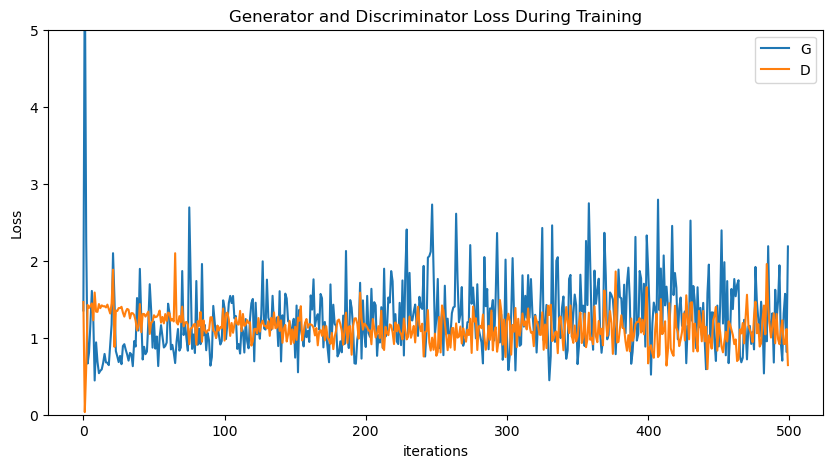

In [17]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.ylim([0, 5])
plt.legend()
plt.show()

**Visualization of G's progression**

Remember how we saved the generator's output on the fixed\_noise batch
after every epoch of training. Now, we can visualize the training
progression of G with an animation. Press the play button to start the
animation.


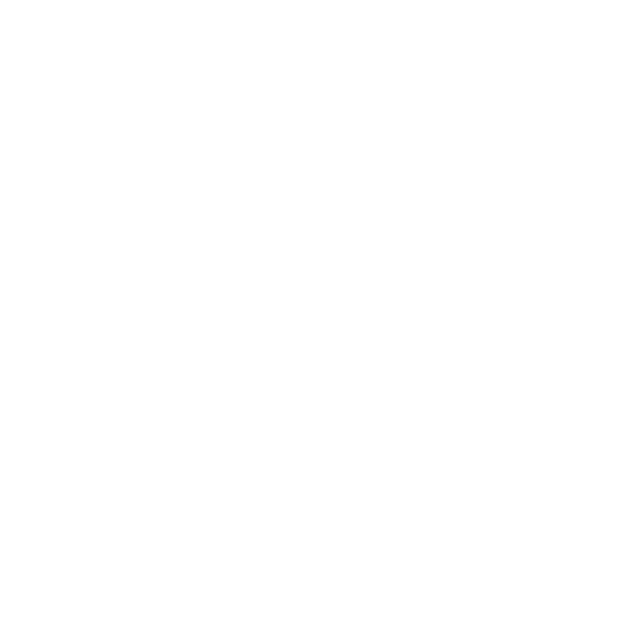

In [22]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

**Real Images vs. Fake Images**

Finally, lets take a look at some real images and fake images side by
side.


IndexError: list index out of range

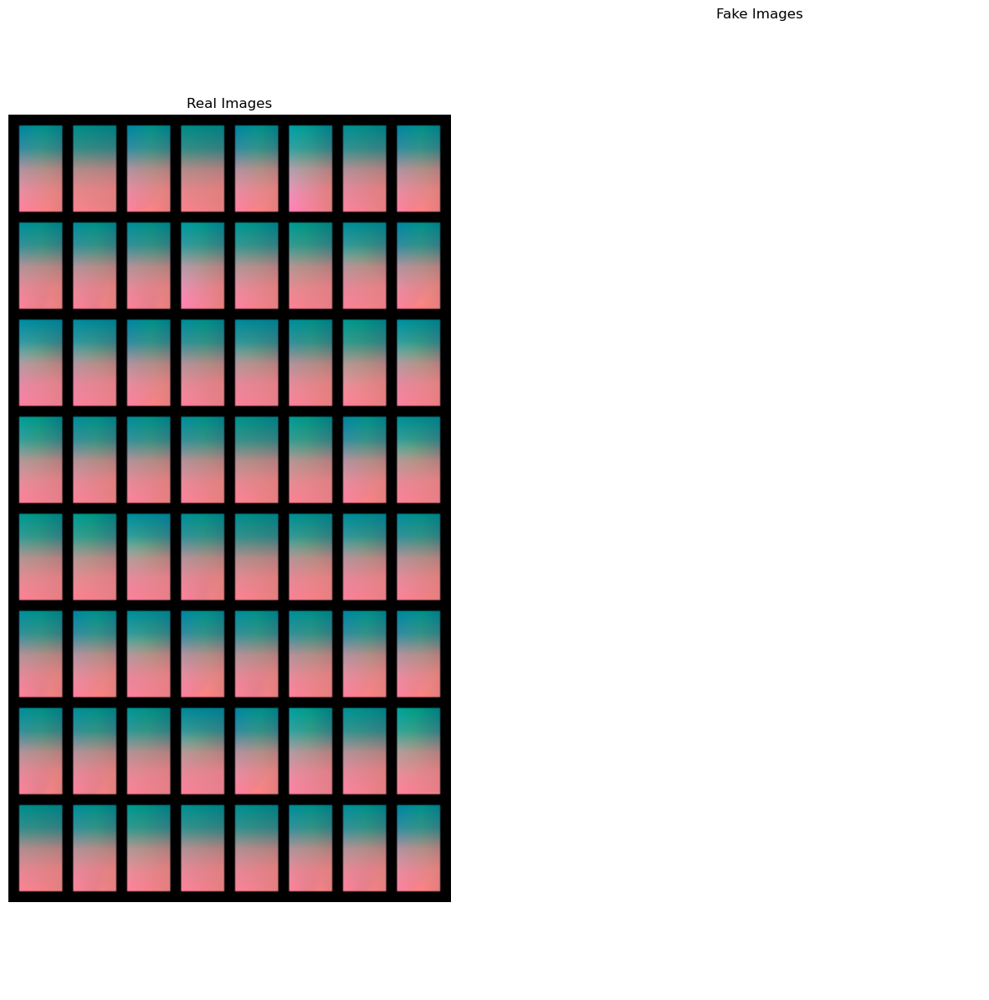

In [19]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [23]:
plt.imshow(np.transpose(img_list[-1][:, 2:42 , 2:22],(1,2,0)))

IndexError: list index out of range

In [ ]:
# Get a batch of designs
img_fake_1 = img_list[-1][:, 2:42 , 2:22]

# Convert to numpy and plot first 4 designs
designs = img_fake_1.unsqueeze(0).cpu().numpy()
print(designs.shape)
fig = uplot.plot_design_grid(designs, rows=1, cols=1)
fig.show()

# Load and visualize checkpoints

In [ ]:
def process_generated_image(generated_image_tensor):

    # Move the tensor from GPU to CPU, convert to numpy array, extract first batch
    generated_image = generated_image_tensor.detach().to('cpu').numpy()[0]

    # move colour channel from dim 0 to dim 2 (C,H,W) -> (H,W,C)
    generated_image = np.moveaxis(generated_image,0, 2)

    # Since CelebA images are RGB we don't use this
    # if generating grayscale/1 channel images use this to repeat channel 3 times to get RGB image for OpenCV to display
    # generated_image = np.repeat(generated_image, 3, axis=2)

    # Generator outputs pixel valeus in [-1,1] due to tanh activation on last layer
    # transform to [0,1] range for display: add (-1), divide by 2
    generated_image -= np.min(generated_image)
    generated_image /= np.max(generated_image)

    return generated_image


# wrapper to make latent vector z, generate image G(z), and process it for display
def generate_from_random_latent_vector(generator):

    # don't compute gradients when just generating images for dedbugging/tracking (saves VRAM)
    with torch.no_grad(): 
        
        # Generate latent vector (z)
        latent_vector = get_gaussian_latent_vectors(1, next(generator.parameters()).device)
        
        # Generate image G(z)
        image = generator(latent_vector)

        # Process the generated image for display (i.e. convert pixel values from [-1,1] to [0,1])
        generated_image = process_generated_image(image)

    return generated_image


# find next available file name (XXXXXXX.jpg) for generating image
def get_image_ID(input_dir): 

    # search for present images in xxxxxxx.jpg format and dget next available image name 
    def valid_frame_name(str):
        pattern = re.compile(r'[0-9]{6}\.jpg')  # regex, examples it covers: 000000.jpg or 923492.jpg, etc.
        return re.fullmatch(pattern, str) is not None

    # Filter out only images with xxxxxx.jpg format from the input_dir
    valid_frames = list(filter(valid_frame_name, os.listdir(input_dir)))
    if len(valid_frames) > 0:
        # Images in xxxxxx.jpg format: find the biggest such xxxxxx number and increment by 1
        last_img_name = sorted(valid_frames)[-1]
        new_prefix = int(last_img_name.split('.')[0]) + 1  # increment by 1
        # fill with 0's
        return f'{str(new_prefix).zfill(6)}.jpg'
    else:
        # return first image if dir is empty
        return '000000.jpg'

# save generated image to directory
# resolution is 2* 157x128 for easier veiwing by default
def save_image(image_dir, image, resolution=(256, 314), display=False):

    # should get numpy array after postprocessing function
    assert isinstance(image, np.ndarray), f'Expected numpy array got {type(image)}.'

    # get name for image that isn't taken yet
    image_name = get_image_ID(image_dir)

    # convert to uint8 for OpenCV to display
    if image.dtype != np.uint8:
        image = (image*255).astype(np.uint8)

    # OpenCV expects BGR format, so reverse image's channel dim (from RGB) using [::-1]
    cv.imwrite(os.path.join(image_dir, image_name), cv.resize(image[:, :, ::-1], resolution, interpolation=cv.INTER_NEAREST)) 
    image = cv.resize(image, resolution, interpolation=cv.INTER_NEAREST)
    # print image to stdout if desired
    if display:
        plt.imshow(image)
        plt.show()

In [3]:
# path to save discriminator checkpoint
chk_path = './checkpoints/checkpoint_epoch_199_051124.pt'
# load discriminator checkpoint
chk_model = torch.load(chk_path)
print('D loaded from ', chk_path)
print('\n')


D loaded from  ./checkpoints/checkpoint_epoch_199_051124.pt




In [4]:
chk_model['netG']

KeyError: 'netG'

torch.Size([16, 3, 40, 20])
(16, 3, 40, 20)


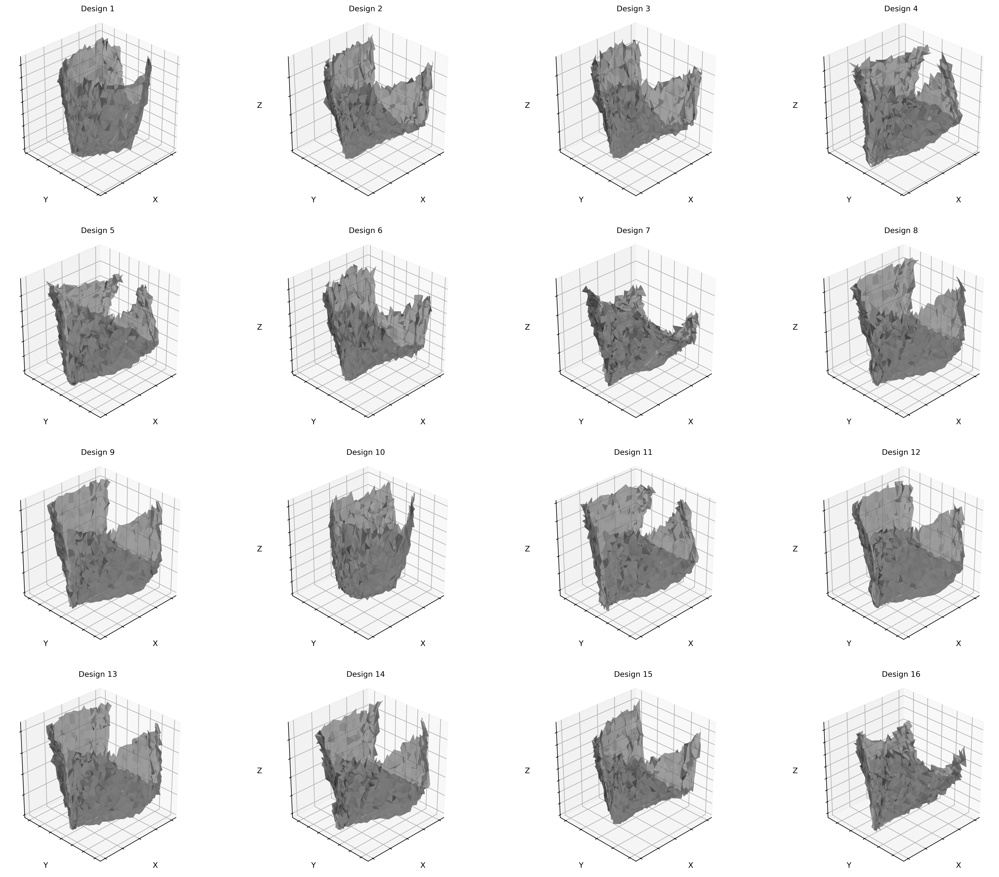

In [24]:
test_noise = torch.randn(16, nz, 1, 1, device=device)
# Generate fake image batch with G
fake = netG(test_noise)
print(fake.shape)
# # Get a batch of designs
real_batch = next(iter(dataloader))


# # Convert to numpy and plot first 4 designs
designs = fake.detach().cpu().numpy()
print(designs.shape)
fig1 = uplot.plot_design_grid_mpl(designs, rows=4, cols=4)
# fig2 = plot_design_grid(designs, rows=1, cols=1)
# fig2.show()

In [21]:
from plotly.subplots import make_subplots
import plotly.graph_objs as go
def plot_design_grid(designs: np.ndarray, titles: list = None, rows: int = 2, cols: int = 2):
    """
    Create a grid of 3D plots based on the given designs.
    
    Args:
        designs: numpy array of shape (N, 3, H, W) where N is number of designs
        titles: list of titles for each subplot
        rows: number of rows in the grid
        cols: number of columns in the grid
    """
    fig = make_subplots(
        rows=rows, cols=cols,
        specs=[[{'type': 'surface'}]*cols]*rows,
        subplot_titles=titles if titles else [f'Design {i+1}' for i in range(len(designs))]
    )

    num_contours = 10
    gray_scale = [[0, '#808080'], [1, '#808080']]
    lighting_settings = dict(ambient=0.4, diffuse=0.6, fresnel=2, specular=0.3, roughness=0.5)
    light_position = dict(x=100, y=100, z=1000)

    for idx, design_3D in enumerate(designs):
        # Calculate row and column position
        row = idx // cols + 1
        col = idx % cols + 1

        # Calculate ranges and sizes for contours
        range_x = design_3D[0, :, :].max() - design_3D[0, :, :].min()
        size_x = range_x / (2 * num_contours)
        range_y = design_3D[1, :, :].max() - design_3D[1, :, :].min()
        size_y = range_y / num_contours
        range_z = design_3D[2, :, :].max() - design_3D[2, :, :].min()
        size_z = range_z / num_contours

        # Create both hull surfaces
        for mirror_y in [1, -1]:
            surface = go.Surface(
                x=design_3D[0, :, :],
                y=mirror_y * design_3D[1, :, :],
                z=design_3D[2, :, :],
                colorscale=gray_scale,
                contours={
                    "x": {"show": True, "start": design_3D[0, :, :].min(), "end": design_3D[0, :, :].max(), "size": size_x},
                    "y": {"show": True, "start": mirror_y * design_3D[1, :, :].min(), "end": mirror_y * design_3D[1, :, :].max(), "size": size_y},
                    "z": {"show": True, "start": design_3D[2, :, :].min(), "end": design_3D[2, :, :].max(), "size": size_z}
                },
                showscale=False,
                lighting=lighting_settings,
                lightposition=light_position
            )
            fig.add_trace(surface, row=row, col=col)

    # Update layout for each subplot
    for i in range(1, rows*cols + 1):
        fig.update_scenes(
            aspectmode='data',
            xaxis=dict(showgrid=False, zeroline=False, showline=False, showticklabels=False, title=''),
            yaxis=dict(showgrid=False, zeroline=False, showline=False, showticklabels=False, title=''),
            zaxis=dict(showgrid=False, zeroline=False, showline=False, showticklabels=False, title=''),
            bgcolor="rgba(0,0,0,0)",
            camera=dict(up=dict(x=0, y=0, z=1), center=dict(x=0.5, y=0, z=0), eye=dict(x=2, y=1.8, z=1.8)),
            row=((i-1)//cols + 1), col=((i-1)%cols + 1)
        )

    fig.update_layout(
        height=1400*rows,
        width=1500*cols,
        title_font=dict(size=24, family="Arial, bold"),
        showlegend=False
    )

    return fig
